In [1]:
import tarfile
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import random
from PIL import Image
import seaborn as sns
import math
from tqdm import tqdm  
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from PIL import Image, ImageOps
from sklearn.model_selection import train_test_split
from torch.optim.lr_scheduler import ReduceLROnPlateau

## Galaxy Zoo Data Analysis

_GalaxyZoo/Classify: https://www.zooniverse.org/projects/zookeeper/galaxy-zoo/classify._

## Galaxy With Clear Spiral Structure

![galaxy with clear spiral structure](clear_structure.png)

## Galaxy With Clear Morpologically Smooth Structure

![galaxy with morpologically smooth structure](smooth_structure.png)

## Finding Details of Galaxy Zoo Sample Images

In [ ]:
images_tar_path = 'training_images.tar'

# Directory 
image_folder = 'training_images'
if not os.path.exists(image_folder):
    os.mkdir(image_folder)

# images from the tar file
with tarfile.open(images_tar_path) as tar:
    for member in tar.getmembers():
        
        if member.name.endswith('.jpg') and not member.name.startswith('._'):
            
            member.name = os.path.relpath(member.name, 'training_images')
            tar.extract(member, path=image_folder)

Number of Files: 61578 


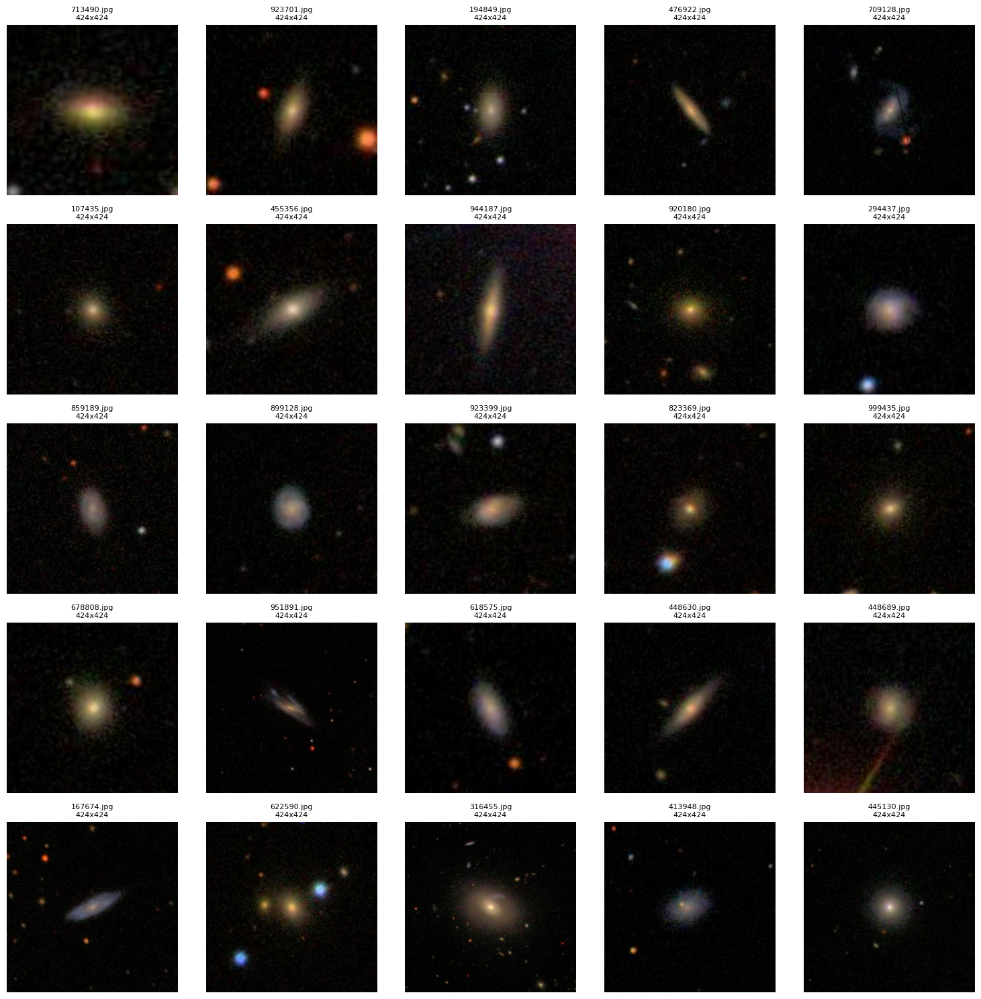

In [2]:
directory_path = 'training_images'

#LIST FOR TRAINING SET
file_list = [file for file in os.listdir(directory_path) if file.endswith('.jpg') and not file.startswith('._')]


number_of_files = len(file_list)

#number of files
print(f"Number of Files: {number_of_files} ")

selected_files = random.sample(file_list, 25)

# Plotting the images
plt.figure(figsize=(15, 15))  
for i, file_name in enumerate(selected_files, start=1):
    img_path = os.path.join(directory_path, file_name)
    img = Image.open(img_path)  
    img_array = np.array(img)  
    ax = plt.subplot(5, 5, i)  
    ax.axis('off')  
    ax.imshow(img_array)  
        
    ax.set_title(f"{file_name}\n{img_array.shape[1]}x{img_array.shape[0]}", fontsize=8)

plt.tight_layout()  
plt.show()

## Distribution of The Classifications of Galaxy Zoo

In [2]:
classifications_csv_path = 'training_classifications.csv'
classifications = pd.read_csv(classifications_csv_path)

In [203]:
descriptive_labels = {
    'Class1.1': 'galaxy - smooth',
    'Class1.2': 'galaxy - features or disk',
    'Class1.3': 'galaxy - star or artifact',
    'Class2.1': 'disk - edge-on',
    'Class2.2': 'disk - not edge-on',
    'Class3.1': 'bar feature - bar',
    'Class3.2': 'bar feature - no bar',
    'Class4.1': 'spiral arm pattern - spiral',
    'Class4.2': 'spiral arm pattern - no spiral',
    'Class5.1': 'bulge - no bulge',
    'Class5.2': 'bulge - just noticeable',
    'Class5.3': 'bulge - obvious',
    'Class5.4': 'bulge - dominant',
    'Class6.1': 'odd - yes',
    'Class6.2': 'odd - no',
    'Class7.1': 'roundness - rounded',
    'Class7.2': 'roundness - in between',
    'Class7.3': 'roundness - cigar-shaped',
    'Class8.1': 'odd feature - ring',
    'Class8.2': 'odd feature - lens or arc',
    'Class8.3': 'odd feature - disturbed',
    'Class8.4': 'odd feature - irregular',
    'Class8.5': 'odd feature - other',
    'Class8.6': 'odd feature - merger',
    'Class8.7': 'odd feature - dust lane',
    'Class9.1': 'bulge shape - rounded',
    'Class9.2': 'bulge shape - boxy',
    'Class9.3': 'bulge shape - no bulge',
    'Class10.1': 'arms - tight',
    'Class10.2': 'arms - medium',
    'Class10.3': 'arms - loose',
    'Class11.1': 'arm count - 1',
    'Class11.2': 'arm count - 2',
    'Class11.3': 'arm count - 3',
    'Class11.4': 'arm count - 4',
    'Class11.5': 'arm count - more than four',
    'Class11.6': 'arm count - cant tell'
}

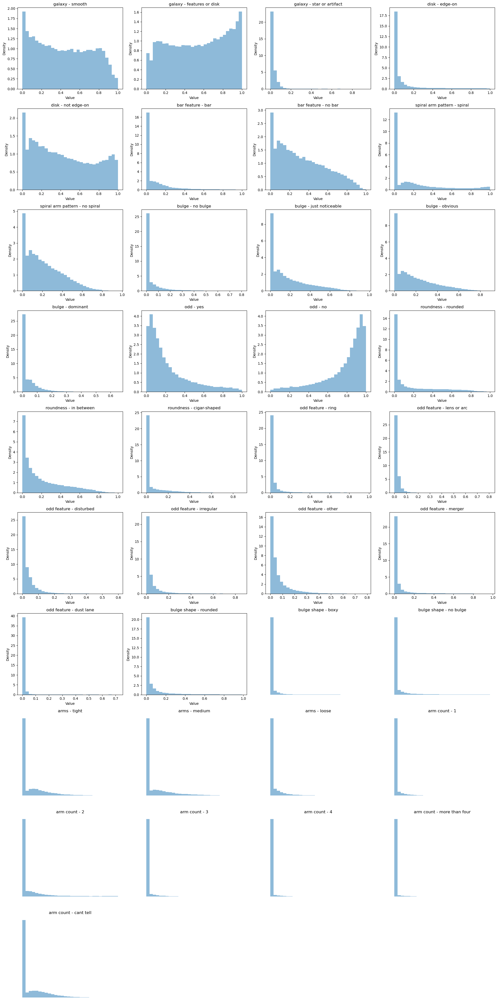

In [5]:
fig, axes = plt.subplots(nrows=10, ncols=4, figsize=(20, 40))  
axes = axes.flatten() 

for idx, column in enumerate(classifications.columns[1:]):  # Skipping ID
    ax = axes[idx]
    classifications[column].plot(kind='hist', bins=30, density=True, alpha=0.5, ax=ax)  
    ax.set_title(descriptive_labels.get(column, column)) 
    ax.set_xlabel('Value')
    ax.set_ylabel('Density')

for ax in axes[i+1:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

## Sample of Images for each Classification

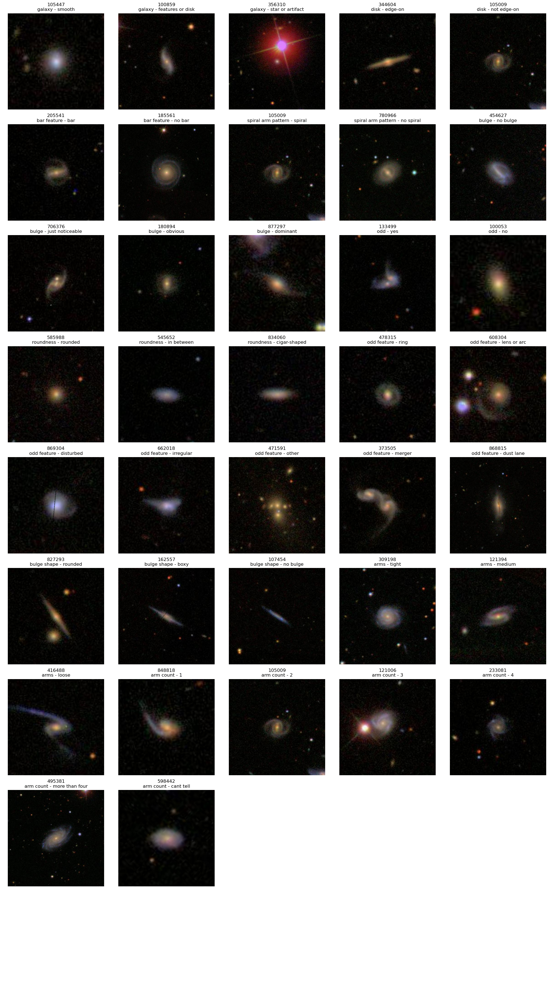

In [26]:
image_folder = 'training_images'
prototypes = classifications.idxmax().drop('GalaxyID')  

#prototypes
fig, axes = plt.subplots(nrows=9, ncols=5, figsize=(20, 36))
axes = axes.flatten()

for i, (label, idx) in enumerate(prototypes.items()):
    image_id = classifications.loc[idx, 'GalaxyID']
    image_path = os.path.join(image_folder, f"{image_id}.jpg")
    image = plt.imread(image_path)
    
    axes[i].imshow(image)
    axes[i].set_title(f"{image_id}\n{descriptive_labels[label]}")
    axes[i].axis('off')

#unused subplots 
for ax in axes[i+1:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

## Correlation Matrix of Classifications

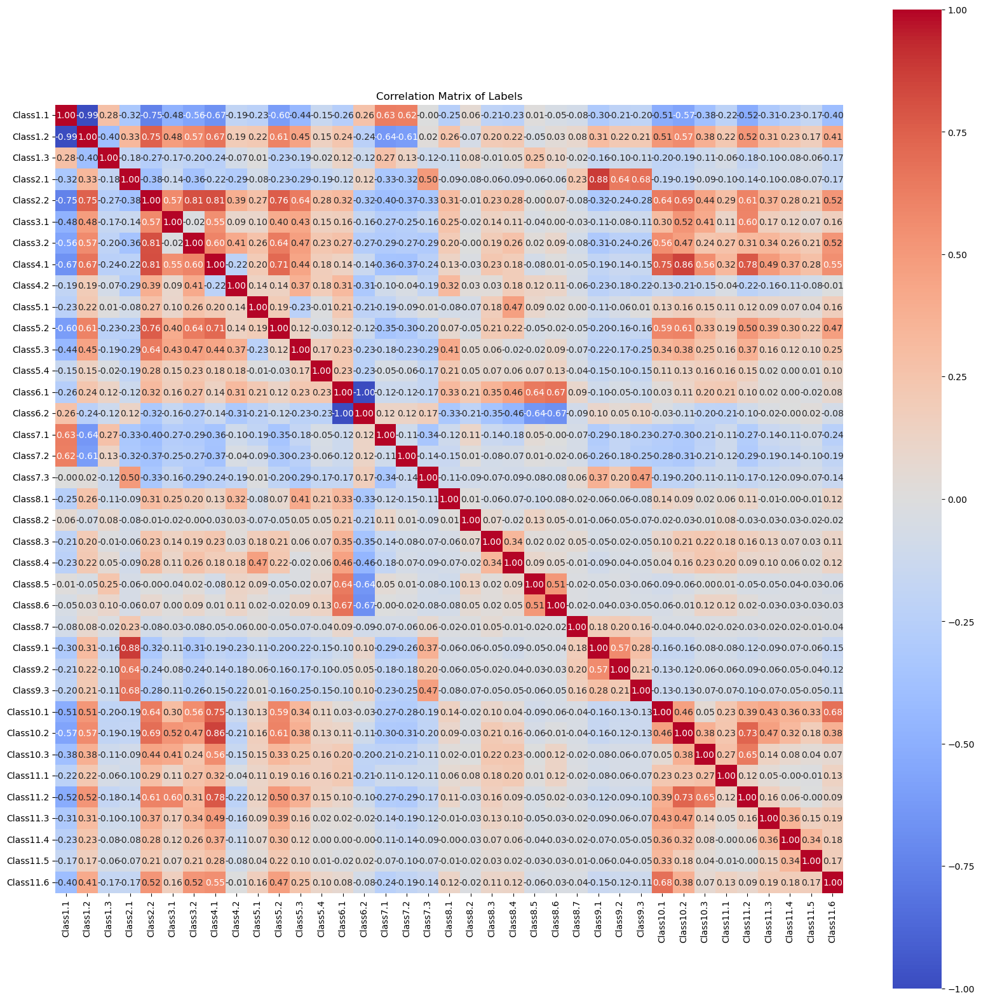

In [9]:
label_data = classifications.drop('GalaxyID', axis=1)

# Compute the correlation matrix
correlation_matrix = label_data.corr()

# Plot the correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Correlation Matrix of Labels')
plt.show()

## Correlation Matrix of within Classifications Groups

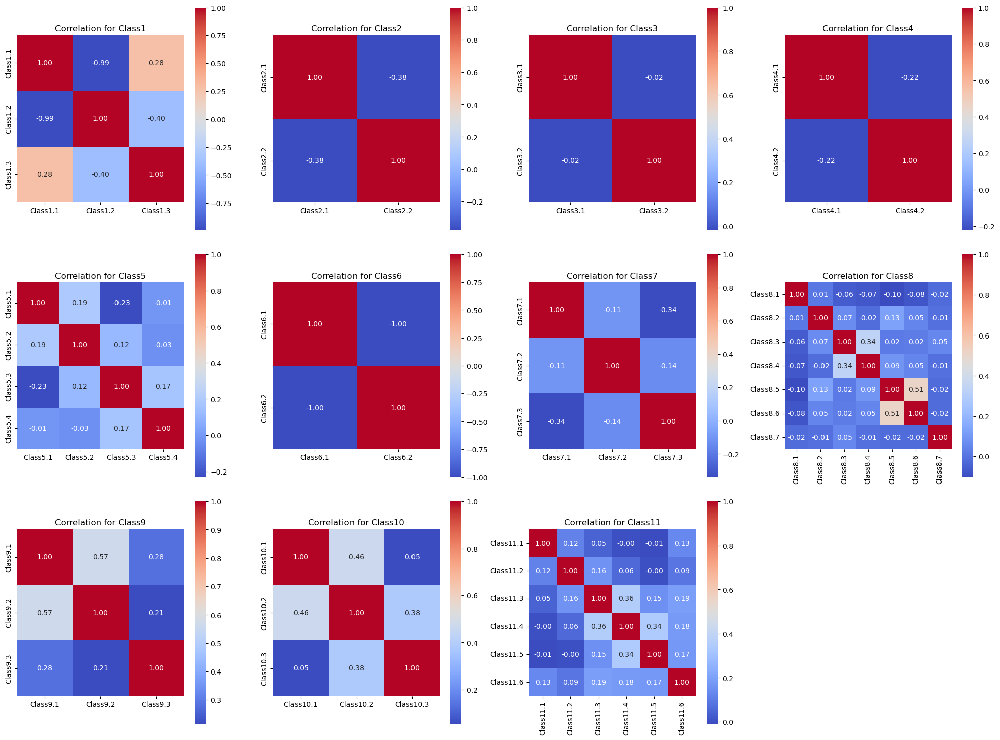

In [5]:
num_classes = 11
class_labels = [f'Class{c+1}.' for c in range(num_classes)]

#correlation matrices 
fig, axes = plt.subplots(3, 4, figsize=(20, 15))  
axes = axes.flatten() 

for i, class_label in enumerate(class_labels):
    # current class label
    class_columns = [col for col in classifications.columns if col.startswith(class_label)]
    class_data = classifications[class_columns]
    
    #correlation matrix 
    corr_matrix = class_data.corr()
    
    
    ax = axes[i]
    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, ax=ax)
    ax.set_title(f'Correlation for {class_label[:-1]}')


axes[-1].axis('off')

plt.tight_layout()
plt.show()

## Current Memory to Load Images ?

In [6]:
# Image dimensions
width = 424
height = 424
channels = 3
bytes_per_channel = 1

# Number of images
num_images = 61578

# Memory calculation
memory_per_image = width * height * channels * bytes_per_channel
total_memory = memory_per_image * num_images

# Convert to a higher unit (bytes to megabytes)
total_memory_mb = total_memory / (1024 * 1024)

total_memory_mb

31672.229370117188

## Creating Downsizer for NN Image Processing

In [7]:
from PIL import Image, ImageOps

def downsize_images_in_folder(input_folder, output_folder, target_reduction_factor=30):
    
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Process each image in the input folder
    for image_file in os.listdir(input_folder):
        if image_file.endswith('.jpg') and not image_file.startswith('._'):
            
            try:
                with Image.open(os.path.join(input_folder, image_file)) as img:
                    # cropping size  OF 5% from each border 
                    border = (img.size[0] * 0.05, img.size[1] * 0.05, img.size[0] * 0.05, img.size[1] * 0.05)
                    img_cropped = ImageOps.crop(img, border)

                    # Calculate the new dimensions based on the target reduction factor
                    # reduced by the target factor
                    scale_factor = math.sqrt(target_reduction_factor)
                    new_dimensions = (
                        max(1, int(img_cropped.size[0] // scale_factor)),
                        max(1, int(img_cropped.size[1] // scale_factor))
                    )

                    #  new dimensions
                    img_resampled = img_cropped.resize(new_dimensions, Image.Resampling.LANCZOS)

                    
                    img_resampled.save(os.path.join(output_folder, image_file))
            except Exception as e:
                print(f"Failed {image_file}: {e}")


input_folder = 'training_images'  
output_folder = 'new_training_images'  
downsize_images_in_folder(input_folder, output_folder)

## Before and After Downsizing

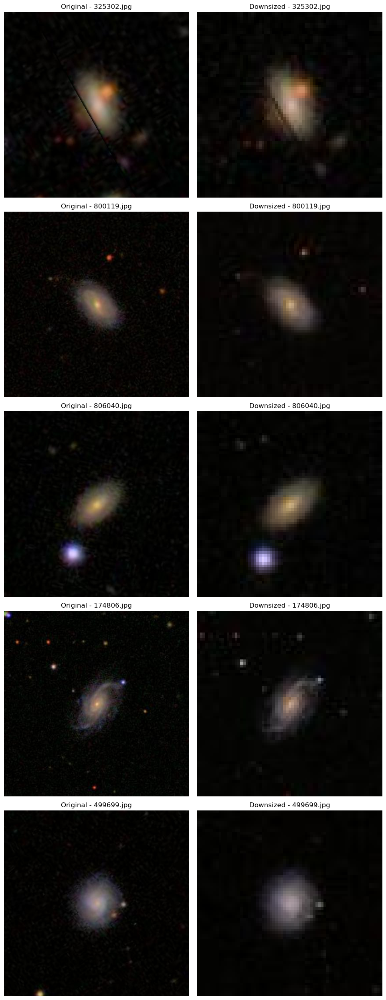

In [3]:
def compare_images(input_folder, output_folder, num_images=5):
    
    image_files = [f for f in os.listdir(input_folder) if f.endswith('.jpg') and not f.startswith('._')]
    
    # random subset 
    selected_files = random.sample(image_files, num_images)
# Set up the plot
    fig, axs = plt.subplots(num_images, 2, figsize=(10, num_images * 5))
    
    for i, image_file in enumerate(selected_files):
        # original image
        original_image = Image.open(os.path.join(input_folder, image_file))
        
        # downsized image
        downsized_image = Image.open(os.path.join(output_folder, image_file))

        
        axs[i, 0].imshow(original_image)
        axs[i, 0].set_title(f'Original - {image_file}')
        axs[i, 0].axis('off')

        
        axs[i, 1].imshow(downsized_image)
        axs[i, 1].set_title(f'Downsized - {image_file}')
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()


input_folder = 'training_images'  
output_folder = 'new_training_images'  
compare_images(input_folder, output_folder)

## Creating Batch Generator for NN Image Processing

In [2]:
#REFINED GENERATOR
def batch_generator(data_df, image_folder, batch_size):
    num_batches = len(data_df) // batch_size + (len(data_df) % batch_size > 0)
    
    for i in range(num_batches):
        batch_slice = slice(i * batch_size, (i + 1) * batch_size)
        batch_df = data_df.iloc[batch_slice]
        
        images = []
        labels = []
        
        for _, row in batch_df.iterrows():
            image_path = os.path.join(image_folder, row['ImagePath'])
            with Image.open(image_path).convert('RGB') as img:
                img_array = np.array(img)
                img_array = np.transpose(img_array, (2, 0, 1))  
                images.append(img_array)
                
            label_data = row.drop(['GalaxyID', 'ImagePath']).values.astype(float)
            labels.append(label_data)
        
        images = np.array(images)
        labels = np.array(labels, dtype=float)  
        
        if np.any(np.isnan(labels)):
            print("NaN values found in labels")
        
        
        yield images, labels

## Cross Validation ; Creating Training & Validation Sets

In [3]:
# labels 
labels_csv_path = 'training_classifications.csv'
labels_df = pd.read_csv(labels_csv_path)


labels_df['ImagePath'] = labels_df['GalaxyID'].apply(lambda x: f"{x}.jpg") #ADDING JPGS AND IDS TOGETHER
# training and validation sets
train_df, valid_df = train_test_split(labels_df, test_size=0.2, random_state=42, shuffle=True)

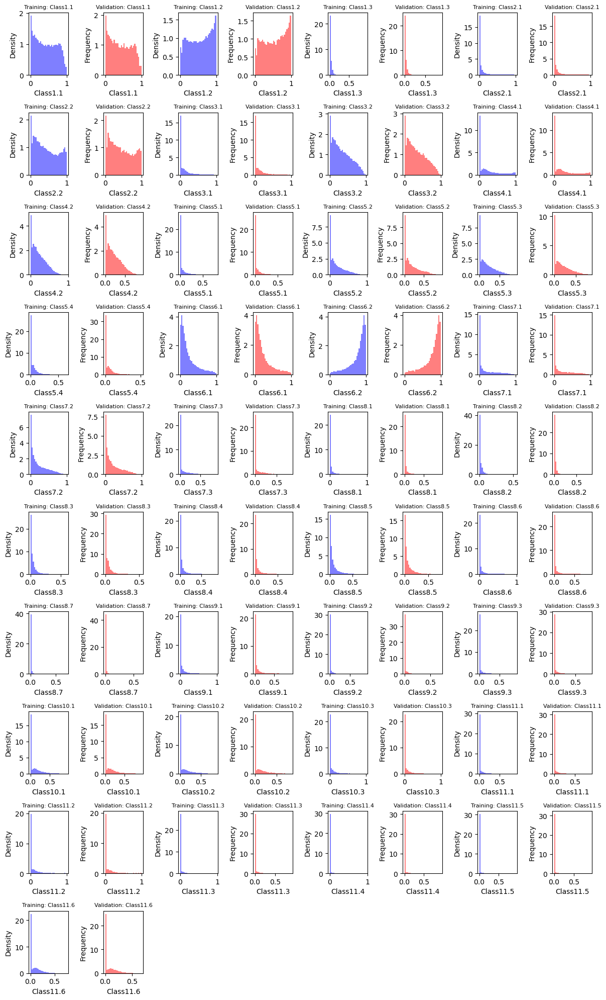

In [4]:
def compare_label_distributions(train_df, valid_df, label_columns):
    
    num_labels = len(label_columns)
    cols = 4  
    rows = (num_labels + cols - 1) // cols  

    fig, axes = plt.subplots(rows, cols * 2, figsize=(12, rows * 2), squeeze=False)  

    for i, label in enumerate(label_columns):
        row, col = divmod(i, cols)
        # Training plot
        ax = axes[row, col * 2]
        train_df[label].plot(kind='hist', bins=30, alpha=0.5, color='blue', density=True, ax=ax)
        ax.set_title(f'Training: {label}', fontsize=8)
        ax.set_xlabel(label)
        ax.set_ylabel('Density')

        # Validation plot
        ax = axes[row, col * 2 + 1]
        valid_df[label].plot(kind='hist', bins=30, alpha=0.5, color='red', density=True, ax=ax)
        ax.set_title(f'Validation: {label}', fontsize=8)
        ax.set_xlabel(label)

    # Turn off axes for unused subplots
    for j in range(i + 1, rows * cols):
        row, col = divmod(j, cols)
        axes[row, col * 2].axis('off')
        axes[row, col * 2 + 1].axis('off')

    plt.tight_layout()
    plt.show()


label_columns = [col for col in labels_df.columns if col.startswith('Class') and col != 'GalaxyID']
compare_label_distributions(train_df, valid_df, label_columns)

## RMSE of a Basic Model ?

In [29]:
# RMSE calculation function
def rmse_loss(true_labels, predicted_labels):
    N_galaxies, N_labels = true_labels.shape
    return np.sqrt(np.sum((true_labels - predicted_labels)**2) / (N_galaxies * N_labels))


# Assuming labels start from the second column and end at the last column
train_labels = train_df.iloc[:, 1:-1].to_numpy(dtype=np.float32)
valid_labels = valid_df.iloc[:, 1:-1].to_numpy(dtype=np.float32)


mean_labels = np.mean(train_labels, axis=0)

# mean labels for each galaxy to form the predicted labels matrix
train_predicted = np.tile(mean_labels, (train_labels.shape[0], 1))
valid_predicted = np.tile(mean_labels, (valid_labels.shape[0], 1))

# RMSE for training and validation sets
train_rmse = rmse_loss(train_labels, train_predicted)
valid_rmse = rmse_loss(valid_labels, valid_predicted)

train_rmse, valid_rmse

print(f"Training RMSE: {train_rmse}")
print(f"Validation RMSE: {valid_rmse}")

Training RMSE: 0.1637932709304058
Validation RMSE: 0.16409999918120458


## Creating Custom Convolutional Neural Network

## The network structure consists of two layers, each followed by batch normalization, ReLU activation and max pooling. The initial convolutional layer applies 32 filters of size 3x3, with padding to maintain dimensions followed by batch normalization and ReLU activation for non linearity and a max pooling layer that reduces the size by half. The second convolutional layer increases the depth to 64 while maintaining the sequence of operations to enhance the networks ability to capture intricate features. Following the layers is a dropout layer that helps prevent overfitting by deactivating a portion (20% in this scenario) of input units during training. The network then moves on to layers; for instance self.fc1 = nn.Linear(64 * 17 * 17 128) adjusts the flattened output of pooled feature maps to a vector of size 128 after the image dimensions shrink from 69x69 to 17x17 post two pooling layers. The final layer employs a sigmoid activation function to produce probabilities for each of the 37 labels. Opting for Adam optimizer over SGD was based on Adams capability to adjust learning rates for parameters and its quicker convergence compared to SGDs slower convergence I received intially by it taking many epochs to get a proper result.

In [41]:
class CNN(nn.Module):
    def __init__(self, num_labels):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.act1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.act2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(2)
        self.dropout = nn.Dropout(0.2)
        self.fc1 = nn.Linear(64 * 17 * 17, 128)
        self.act3 = nn.ReLU()
        self.fc2 = nn.Linear(128, num_labels)
        self.act4 = nn.Sigmoid()

    def forward(self, x):
        x = self.pool1(self.bn1(self.act1(self.conv1(x))))
        x = self.pool2(self.bn2(self.act2(self.conv2(x))))
        x = x.view(x.size(0), -1)
        x = self.dropout(x)
        x = self.act3(self.fc1(x))
        x = self.act4(self.fc2(x))
        return x


# Parameters
num_labels = 37  

# Model initialization
model = CNN(num_labels)

# Optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.MSELoss()  # Using MSE loss

In [42]:
def train_model(model, train_df, valid_df, num_epochs, batch_size):
    train_losses = []
    valid_losses = []
    num_images_seen = 0

    for epoch in range(num_epochs):
        train_gen = batch_generator(train_df, 'new_training_images', batch_size)
        valid_gen = batch_generator(valid_df, 'new_training_images', batch_size)
        
        model.train()
        total_train_loss = 0
        for images, labels in tqdm(train_gen, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images = torch.tensor(images, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.float32)

            optimizer.zero_grad()
            outputs = model(images)
            mse_loss = loss_fn(outputs, labels)
            mse_loss.backward()
            optimizer.step()

            total_train_loss += mse_loss.item() * images.size(0)

        average_train_loss = np.sqrt(total_train_loss / len(train_df))
        train_losses.append(average_train_loss)
        num_images_seen += 1

        # Validation
        model.eval()
        total_val_loss = 0
        count = 0
        with torch.no_grad():  # Ensure no gradients are calculated during validation
            for images, labels in tqdm(valid_gen, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images = torch.tensor(images, dtype=torch.float32)
                labels = torch.tensor(labels, dtype=torch.float32)

                outputs = model(images)
                mse_loss = loss_fn(outputs, labels)
                total_val_loss += mse_loss.item() * images.size(0)
                count += images.size(0)

        if count == 0:
            print("No data processed in validation.")
        else:
            average_val_loss = np.sqrt(total_val_loss / count)
            valid_losses.append(average_val_loss)
            print(f'Epoch {epoch+1}, Training RMSE: {average_train_loss}, Validation RMSE: {average_val_loss}')

    return train_losses, valid_losses, num_images_seen

In [43]:
# Start training
num_epochs = 10
batch_size = 200
train_losses, valid_losses, num_images_seen = train_model(model, train_df, valid_df, num_epochs,batch_size )

Epoch 1/10 - Training: 247it [03:27,  1.19it/s]
Epoch 1/10 - Validation: 62it [00:26,  2.35it/s]


Epoch 1, Training RMSE: 0.16448004257888654, Validation RMSE: 0.14049317009825993


Epoch 2/10 - Training: 247it [02:48,  1.46it/s]
Epoch 2/10 - Validation: 62it [00:26,  2.38it/s]


Epoch 2, Training RMSE: 0.13364397228493674, Validation RMSE: 0.12764215347775895


Epoch 3/10 - Training: 247it [02:48,  1.47it/s]
Epoch 3/10 - Validation: 62it [00:26,  2.37it/s]


Epoch 3, Training RMSE: 0.12351730322781222, Validation RMSE: 0.12364525479117743


Epoch 4/10 - Training: 247it [02:49,  1.46it/s]
Epoch 4/10 - Validation: 62it [00:26,  2.37it/s]


Epoch 4, Training RMSE: 0.11891024998389373, Validation RMSE: 0.12147414676775332


Epoch 5/10 - Training: 247it [02:48,  1.46it/s]
Epoch 5/10 - Validation: 62it [00:25,  2.39it/s]


Epoch 5, Training RMSE: 0.11524973101496828, Validation RMSE: 0.1201931503182754


Epoch 6/10 - Training: 247it [02:47,  1.47it/s]
Epoch 6/10 - Validation: 62it [00:26,  2.38it/s]


Epoch 6, Training RMSE: 0.11200694777935993, Validation RMSE: 0.11904688905553253


Epoch 7/10 - Training: 247it [02:48,  1.47it/s]
Epoch 7/10 - Validation: 62it [00:25,  2.40it/s]


Epoch 7, Training RMSE: 0.1090316638035193, Validation RMSE: 0.11824533446415084


Epoch 8/10 - Training: 247it [02:49,  1.45it/s]
Epoch 8/10 - Validation: 62it [00:26,  2.33it/s]


Epoch 8, Training RMSE: 0.10649209804827663, Validation RMSE: 0.11783641951846603


Epoch 9/10 - Training: 247it [02:50,  1.45it/s]
Epoch 9/10 - Validation: 62it [00:26,  2.34it/s]


Epoch 9, Training RMSE: 0.10417968291807525, Validation RMSE: 0.11848369642112903


Epoch 10/10 - Training: 247it [02:48,  1.46it/s]
Epoch 10/10 - Validation: 62it [00:27,  2.26it/s]

Epoch 10, Training RMSE: 0.10224677690882919, Validation RMSE: 0.11852855140256426


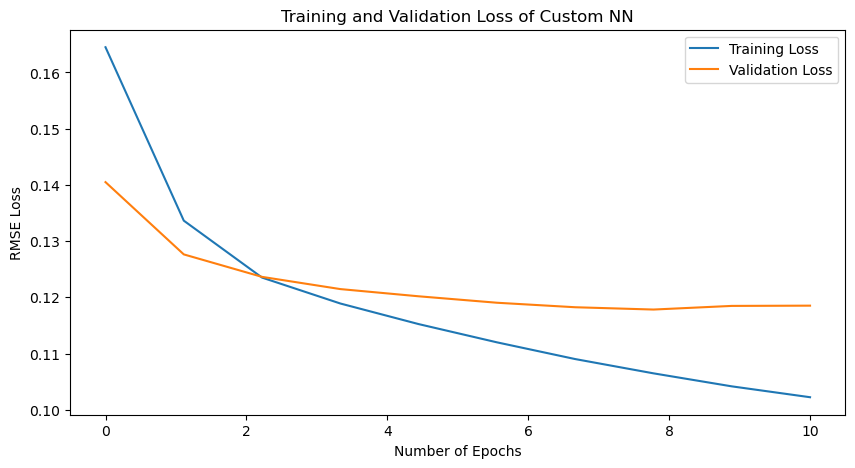

In [56]:
def plot_losses(train_losses, valid_losses, num_images_seen):
    plt.figure(figsize=(10, 5))
    plt.plot(np.linspace(0, num_images_seen, len(train_losses)), train_losses, label='Training Loss')
    plt.plot(np.linspace(0, num_images_seen, len(valid_losses)), valid_losses, label='Validation Loss')
    plt.xlabel('Number of Epochs')
    plt.ylabel('RMSE Loss')
    plt.title('Training and Validation Loss of Custom NN')
    plt.legend()
    plt.show()

plot_losses(train_losses, valid_losses, num_images_seen)

In [45]:
torch.save(model.state_dict(), 'custom_model.pth')

## Total Trainable Parameters of This Model ?

In [51]:
num_images = len(train_df)
img = Image.open("new_training_images/994549.jpg")  
img_array = np.array(img)  
image_height = img_array.shape[0]
image_width = img_array.shape[1]



def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


total_trainable_params = count_parameters(model)


num_pixels = image_height * image_width * num_images

print(f"Total trainable parameters: {total_trainable_params}")
print(f"Total number of pixels in the training set: {num_pixels}")

Total trainable parameters: 2391973
Total number of pixels in the training set: 234536382


## Using Resnet Modifications for Better Image Classifications

In [57]:
# ResNet18 model
model_2 = models.resnet18(pretrained=False)
model_2.fc = nn.Linear(model_2.fc.in_features, num_labels)  
model_2.avgpool = nn.AdaptiveAvgPool2d((1, 1))
# optimizer for model_2
optimizer_2 = optim.Adam(model_2.parameters(), lr=0.00001)

# same loss function as before
loss_fn_2 = nn.MSELoss()

/srv/conda/envs/notebook/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/srv/conda/envs/notebook/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [58]:


def train_model_2(model, train_df, valid_df, num_epochs, batch_size):
    train_losses = []
    valid_losses = []
    num_images_seen = 0

    for epoch in range(num_epochs):
        # generators
        train_gen = batch_generator(train_df, 'new_training_images', batch_size)
        valid_gen = batch_generator(valid_df, 'new_training_images', batch_size)
        
        # Training
        model.train()
        total_train_loss = 0
        for images, labels in tqdm(train_gen, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images = torch.tensor(images, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.float32)

            optimizer_2.zero_grad()
            outputs = model(images)
            mse_loss = loss_fn_2(outputs, labels)
            mse_loss.backward()
            optimizer_2.step()

            total_train_loss += mse_loss.item() * images.size(0)

        average_train_loss = np.sqrt(total_train_loss / len(train_df))
        train_losses.append(average_train_loss)
        num_images_seen += 1

        # Validation
        model.eval()
        total_val_loss = 0
        count = 0
        with torch.no_grad():
            for images, labels in tqdm(valid_gen, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images = torch.tensor(images, dtype=torch.float32)
                labels = torch.tensor(labels, dtype=torch.float32)

                outputs = model(images)
                mse_loss = loss_fn_2(outputs, labels)
                total_val_loss += mse_loss.item() * images.size(0)
                count += images.size(0)

        average_val_loss = np.sqrt(total_val_loss / count)
        valid_losses.append(average_val_loss)
        print(f'Epoch {epoch+1}, Training RMSE: {average_train_loss}, Validation RMSE: {average_val_loss}')

    return train_losses, valid_losses, num_images_seen

# ResNet model
num_epochs = 10
batch_size2 =200
train_losses_2, valid_losses_2, num_images_seen_2 = train_model_2(model_2, train_df, valid_df, num_epochs,batch_size2)

Epoch 1/10 - Training: 247it [05:07,  1.24s/it]
Epoch 1/10 - Validation: 62it [00:34,  1.79it/s]


Epoch 1, Training RMSE: 0.24119312684831531, Validation RMSE: 0.15139665514735354


Epoch 2/10 - Training: 247it [05:15,  1.28s/it]
Epoch 2/10 - Validation: 62it [00:34,  1.77it/s]


Epoch 2, Training RMSE: 0.14378150299243395, Validation RMSE: 0.1388782015339002


Epoch 3/10 - Training: 247it [05:12,  1.26s/it]
Epoch 3/10 - Validation: 62it [00:34,  1.78it/s]


Epoch 3, Training RMSE: 0.134658356522882, Validation RMSE: 0.13284658384432046


Epoch 4/10 - Training: 247it [05:09,  1.25s/it]
Epoch 4/10 - Validation: 62it [00:34,  1.78it/s]


Epoch 4, Training RMSE: 0.1293626517908491, Validation RMSE: 0.12922276097822913


Epoch 5/10 - Training: 247it [05:10,  1.26s/it]
Epoch 5/10 - Validation: 62it [00:35,  1.75it/s]


Epoch 5, Training RMSE: 0.12563714645086227, Validation RMSE: 0.12670883298786006


Epoch 6/10 - Training: 247it [05:08,  1.25s/it]
Epoch 6/10 - Validation: 62it [00:34,  1.77it/s]


Epoch 6, Training RMSE: 0.12269994366962643, Validation RMSE: 0.12483875268643847


Epoch 7/10 - Training: 247it [05:08,  1.25s/it]
Epoch 7/10 - Validation: 62it [00:34,  1.79it/s]


Epoch 7, Training RMSE: 0.1202080999923632, Validation RMSE: 0.1233135485803657


Epoch 8/10 - Training: 247it [05:09,  1.25s/it]
Epoch 8/10 - Validation: 62it [00:34,  1.77it/s]


Epoch 8, Training RMSE: 0.11799276401087297, Validation RMSE: 0.12206527920982764


Epoch 9/10 - Training: 247it [05:09,  1.25s/it]
Epoch 9/10 - Validation: 62it [00:34,  1.78it/s]


Epoch 9, Training RMSE: 0.11595579958025047, Validation RMSE: 0.12105397731066375


Epoch 10/10 - Training: 247it [05:10,  1.26s/it]
Epoch 10/10 - Validation: 62it [00:34,  1.78it/s]

Epoch 10, Training RMSE: 0.11405057544479635, Validation RMSE: 0.12034924686285357


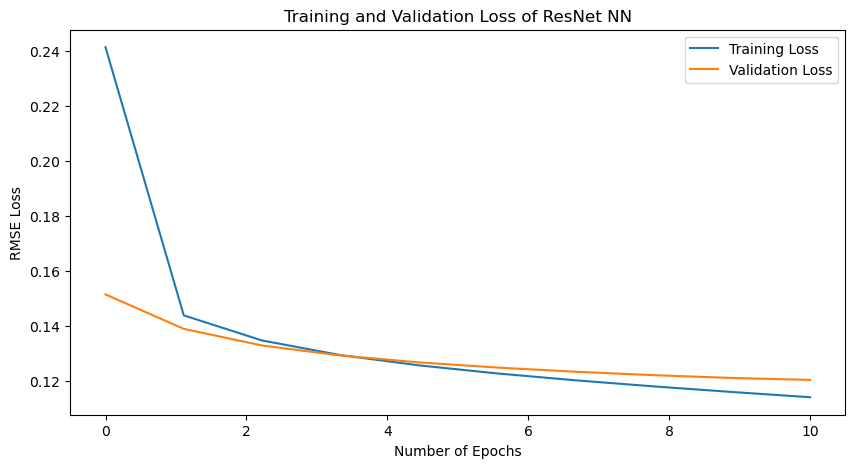

In [59]:
def plot_losses2(train_losses, valid_losses, num_images_seen):
    plt.figure(figsize=(10, 5))
    plt.plot(np.linspace(0, num_images_seen, len(train_losses)), train_losses, label='Training Loss')
    plt.plot(np.linspace(0, num_images_seen, len(valid_losses)), valid_losses, label='Validation Loss')
    plt.xlabel('Number of Epochs')
    plt.ylabel('RMSE Loss')
    plt.title('Training and Validation Loss of ResNet NN')
    plt.legend()
    plt.show()

plot_losses2(train_losses_2, valid_losses_2, num_images_seen_2)

In [60]:
# trained model to disk
torch.save(model_2.state_dict(), 'resnet_galaxy_model.pth')

In [61]:
total_trainable_params_2 = count_parameters(model_2)

print(f"Total trainable parameters: {total_trainable_params_2}")

Total trainable parameters: 11195493


## Applying Scheduler !

In [62]:

model_3 = models.resnet18(pretrained=False)

model_3.avgpool = nn.AdaptiveAvgPool2d((1, 1))

model_3.fc = nn.Linear(model_3.fc.in_features, num_labels)

optimizer_3 = optim.Adam(model_3.parameters(), lr=0.001)

loss_fn_3 = nn.MSELoss()

/srv/conda/envs/notebook/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/srv/conda/envs/notebook/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [63]:
def train_model_3(model, train_df, valid_df, num_epochs, batch_size):
    train_losses = []
    valid_losses = []
    num_images_seen = 0

    # Initialize the scheduler without verbose
    scheduler = ReduceLROnPlateau(optimizer_3, 'min', factor=0.1, patience=1, verbose=True)

    for epoch in range(num_epochs):

        train_gen = batch_generator(train_df, 'new_training_images', batch_size)
        valid_gen = batch_generator(valid_df, 'new_training_images', batch_size)
        
        model.train()
        total_train_loss = 0
        for images, labels in tqdm(train_gen, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images = torch.tensor(images, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.float32)

            optimizer_3.zero_grad()
            outputs = model(images)
            mse_loss = loss_fn_3(outputs, labels)
            mse_loss.backward()
            optimizer_3.step()

            total_train_loss += mse_loss.item() * images.size(0)

        average_train_loss = np.sqrt(total_train_loss / len(train_df))
        train_losses.append(average_train_loss)
        num_images_seen += len(train_df)

        # Validation phase
        model.eval()
        total_val_loss = 0
        count = 0
        with torch.no_grad():
            for images, labels in tqdm(valid_gen, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images = torch.tensor(images, dtype=torch.float32)
                labels = torch.tensor(labels, dtype=torch.float32)

                outputs = model(images)
                mse_loss = loss_fn_3(outputs, labels)
                total_val_loss += mse_loss.item() * images.size(0)
                count += images.size(0)

        average_val_loss = np.sqrt(total_val_loss / count)
        valid_losses.append(average_val_loss)
        print(f'Epoch {epoch+1}, Training RMSE: {average_train_loss}, Validation RMSE: {average_val_loss}')

        # Scheduler step and print current learning rate
        scheduler.step(average_val_loss)
        current_lr = optimizer_3.param_groups[0]['lr']
        print(f"After Epoch {epoch+1}, learning rate is adjusted to: {current_lr}")

    return train_losses, valid_losses, num_images_seen

In [64]:
# Train the ResNet18 model
num_epochs3 = 10
batch_size3 = 200
train_losses_3, valid_losses_3, num_images_seen_3 = train_model_3(model_3, train_df, valid_df, num_epochs3, batch_size3)

/srv/conda/envs/notebook/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
Epoch 1/10 - Training: 247it [05:14,  1.27s/it]
Epoch 1/10 - Validation: 62it [00:35,  1.77it/s]


Epoch 1, Training RMSE: 0.14076320522412886, Validation RMSE: 0.14097470683586005
After Epoch 1, learning rate is adjusted to: 0.001


Epoch 2/10 - Training: 247it [05:15,  1.28s/it]
Epoch 2/10 - Validation: 62it [00:34,  1.78it/s]


Epoch 2, Training RMSE: 0.11672316661474409, Validation RMSE: 0.12313198273261916
After Epoch 2, learning rate is adjusted to: 0.001


Epoch 3/10 - Training: 247it [05:12,  1.27s/it]
Epoch 3/10 - Validation: 62it [00:34,  1.79it/s]


Epoch 3, Training RMSE: 0.11103090388178181, Validation RMSE: 0.11805671437246486
After Epoch 3, learning rate is adjusted to: 0.001


Epoch 4/10 - Training: 247it [05:12,  1.27s/it]
Epoch 4/10 - Validation: 62it [00:35,  1.77it/s]


Epoch 4, Training RMSE: 0.10722229885743992, Validation RMSE: 0.11439483512297786
After Epoch 4, learning rate is adjusted to: 0.001


Epoch 5/10 - Training: 247it [05:12,  1.27s/it]
Epoch 5/10 - Validation: 62it [00:34,  1.77it/s]


Epoch 5, Training RMSE: 0.10412454551032205, Validation RMSE: 0.11683028474730464
After Epoch 5, learning rate is adjusted to: 0.001


Epoch 6/10 - Training: 247it [05:15,  1.28s/it]
Epoch 6/10 - Validation: 62it [00:34,  1.79it/s]


Epoch 6, Training RMSE: 0.10134962778855006, Validation RMSE: 0.11876391840410998
After Epoch 6, learning rate is adjusted to: 0.0001


Epoch 7/10 - Training: 247it [05:13,  1.27s/it]
Epoch 7/10 - Validation: 62it [00:35,  1.76it/s]


Epoch 7, Training RMSE: 0.0919679741857979, Validation RMSE: 0.11023875434400665
After Epoch 7, learning rate is adjusted to: 0.0001


Epoch 8/10 - Training: 247it [05:15,  1.28s/it]
Epoch 8/10 - Validation: 62it [00:34,  1.77it/s]


Epoch 8, Training RMSE: 0.0887502061912198, Validation RMSE: 0.11036597978929419
After Epoch 8, learning rate is adjusted to: 0.0001


Epoch 9/10 - Training: 247it [05:15,  1.28s/it]
Epoch 9/10 - Validation: 62it [00:34,  1.82it/s]


Epoch 9, Training RMSE: 0.08624054744277848, Validation RMSE: 0.11044996766749911
After Epoch 9, learning rate is adjusted to: 1e-05


Epoch 10/10 - Training: 247it [05:13,  1.27s/it]
Epoch 10/10 - Validation: 62it [00:34,  1.80it/s]

Epoch 10, Training RMSE: 0.08274091451273294, Validation RMSE: 0.10099849873734322
After Epoch 10, learning rate is adjusted to: 1e-05


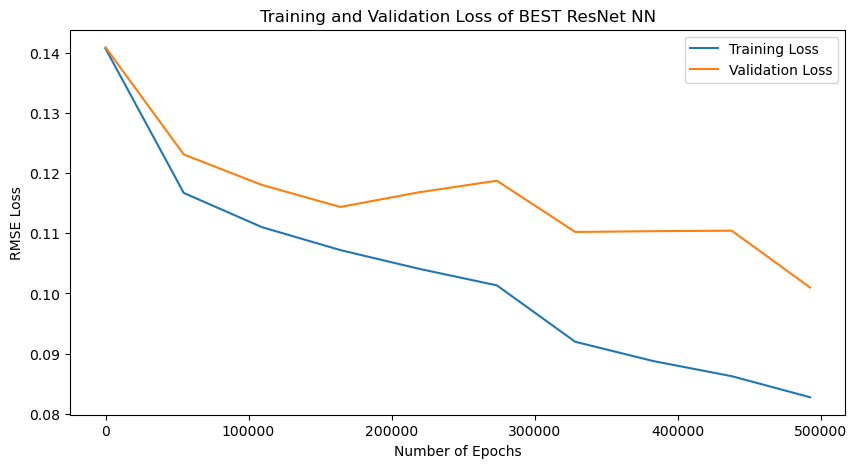

In [65]:
def plot_losses3(train_losses, valid_losses, num_images_seen):
    plt.figure(figsize=(10, 5))
    plt.plot(np.linspace(0, num_images_seen, len(train_losses)), train_losses, label='Training Loss')
    plt.plot(np.linspace(0, num_images_seen, len(valid_losses)), valid_losses, label='Validation Loss')
    plt.xlabel('Number of Epochs')
    plt.ylabel('RMSE Loss')
    plt.title('Training and Validation Loss of BEST ResNet NN')
    plt.legend()
    plt.show()

plot_losses3(train_losses_3, valid_losses_3, num_images_seen_3)

In [66]:
# Save the trained model to disk
torch.save(model_3.state_dict(), 'best_resnet_galaxy_model.pth')

## Comparing the 3 Neural Network Models

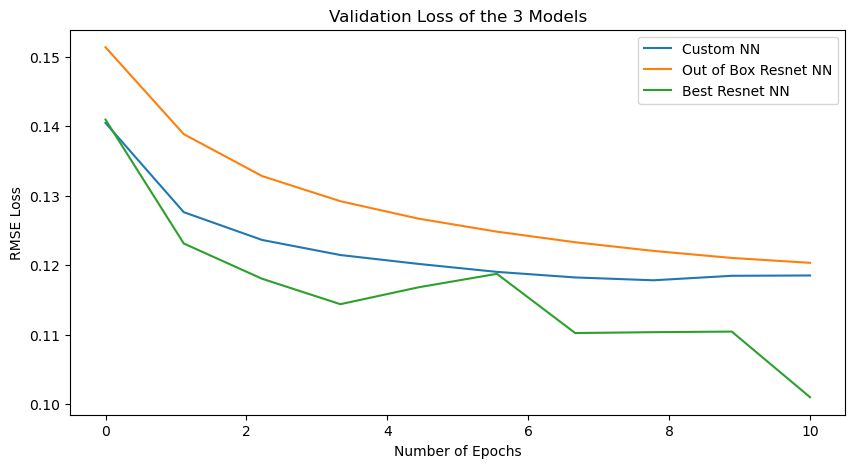

In [72]:
plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, num_images_seen, len(valid_losses)), valid_losses, label='Custom NN')
plt.plot(np.linspace(0, num_images_seen_2, len(valid_losses_2)), valid_losses_2, label='Out of Box Resnet NN')
plt.plot(np.linspace(0, num_images_seen_2, len(valid_losses_2)), valid_losses_3, label='Best Resnet NN')
plt.xlabel('Number of Epochs')
plt.ylabel('RMSE Loss')
plt.title('Validation Loss of the 3 Models')
plt.legend()
plt.show()

## Comparing Predicted and True Values of Classifications using Best NN Model

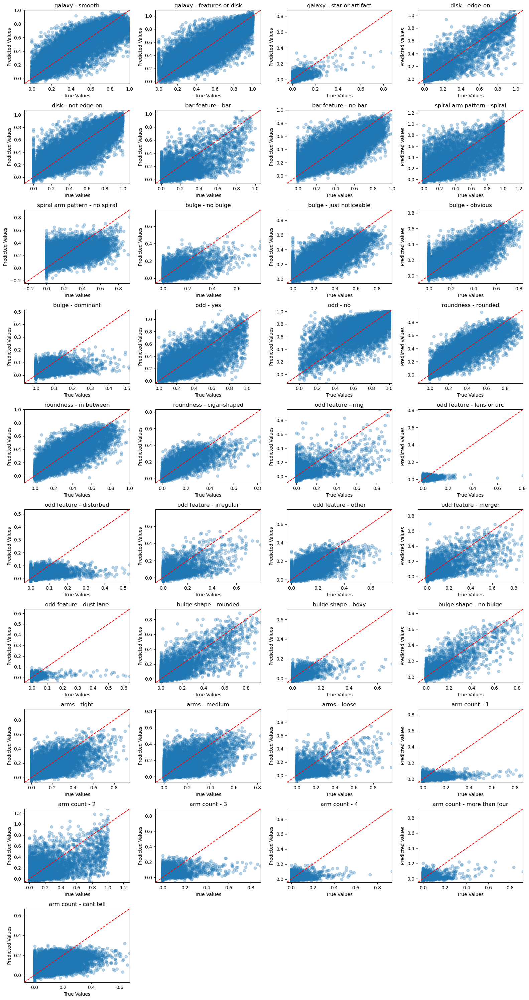

In [204]:

model_3.load_state_dict(torch.load('best_resnet_galaxy_model.pth'))
model_3.eval()


valid_gen = batch_generator(valid_df, 'new_training_images', batch_size=200)
true_labels = []
predicted_labels = []

with torch.no_grad():
    for images, labels in valid_gen:
        images = torch.tensor(images, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.float32)
        outputs = model_3(images)
        
        
        true_labels.extend(labels.numpy())
        predicted_labels.extend(outputs.numpy())
        
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)


num_labels = len(descriptive_labels)
num_cols = 4  
num_rows = (num_labels + num_cols - 1) // num_cols  
fig, axs = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols, 3 * num_rows))
axs = axs.flatten()  

for i, (label_code, label_name) in enumerate(descriptive_labels.items()):
    axs[i].scatter(true_labels[:, i], predicted_labels[:, i], alpha=0.3)
    axs[i].set_title(label_name)
    axs[i].set_xlabel('True Values')
    axs[i].set_ylabel('Predicted Values')
    
    min_val = min(true_labels[:, i].min(), predicted_labels[:, i].min())
    max_val = max(true_labels[:, i].max(), predicted_labels[:, i].max())
    axs[i].set_xlim(min_val, max_val)
    axs[i].set_ylim(min_val, max_val)
    axs[i].plot([min_val, max_val], [min_val, max_val], 'r--')


for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axs[j])

fig.tight_layout()
plt.show()

## Evaluating Extreme Cases in Galaxy Classification: Comparing Actual vs. Predicted Labels

In [92]:
#MODIFIED BATCH GENERATOR
def batch_generator(data_df, image_folder, batch_size=100):
    num_batches = len(data_df) // batch_size + (len(data_df) % batch_size != 0)
    
    for i in range(num_batches):
        batch_slice = slice(i * batch_size, (i + 1) * batch_size)
        batch_df = data_df.iloc[batch_slice]
        
        images = []
        labels = []
        
        for _, row in batch_df.iterrows():
            image_path = os.path.join(image_folder, row['ImagePath'])
            with Image.open(image_path).convert('RGB') as img:
                img_array = np.array(img)
                img_array = np.transpose(img_array, (2, 0, 1))  # Change to [C, H, W]
                images.append(img_array)
                
            label_data = row.drop(['GalaxyID', 'ImagePath']).values.astype(float)
            labels.append(label_data)
        
        yield np.array(images), np.array(labels)


In [ ]:
valid_gen = batch_generator(valid_df, 'new_training_images', batch_size)
labels_csv_path = 'training_classifications.csv'
labels_df = pd.read_csv(labels_csv_path)
labels_df['ImagePath'] = labels_df['GalaxyID'].apply(lambda x: f"{x}.jpg")

train_df, valid_df = train_test_split(labels_df, test_size=0.2, random_state=42, shuffle=True)

model_3.load_state_dict(torch.load('best_resnet_galaxy_model.pth'))
model_3.eval()

def get_predictions(model, data_loader):
    model.eval()
    predictions = []
    with torch.no_grad():
        for images, _ in data_loader:
            images = torch.tensor(images, dtype=torch.float32)
            outputs = model(images)
            predictions.extend(outputs.cpu().numpy())
    return np.array(predictions)


predicted_labels = get_predictions(model_3, valid_gen)

for i, col in enumerate(valid_df.columns[1:38]): 
    valid_df['predicted_' + col] = predicted_labels[:, i]

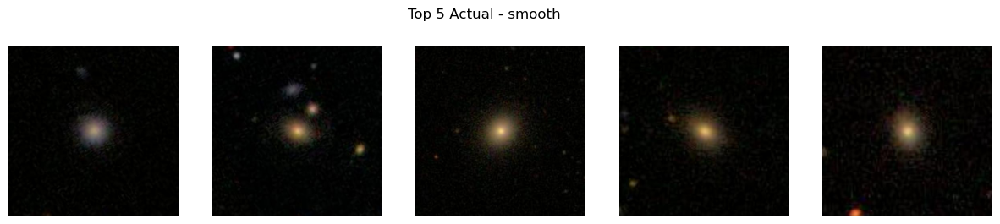

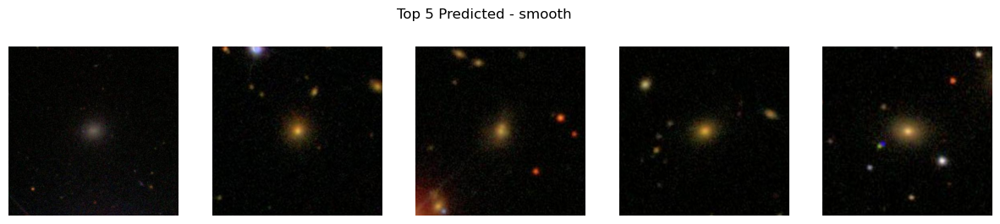

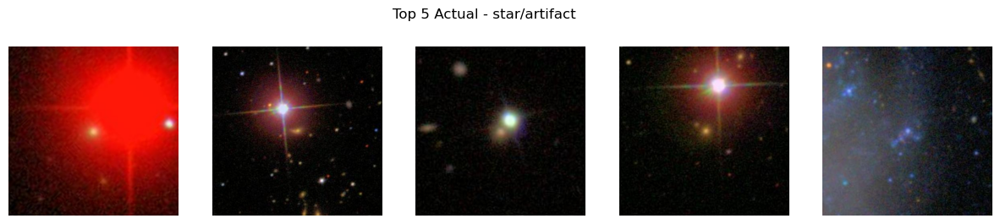

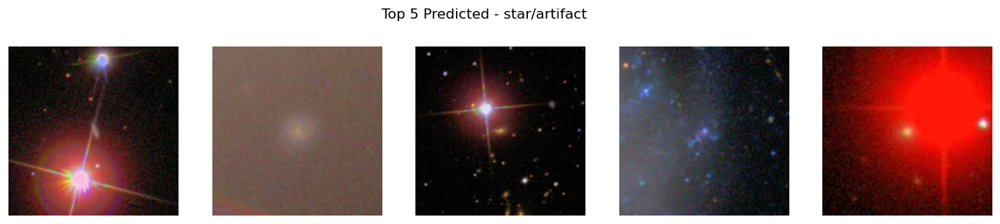

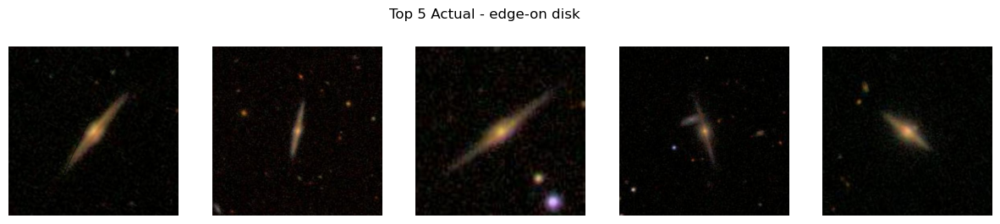

...

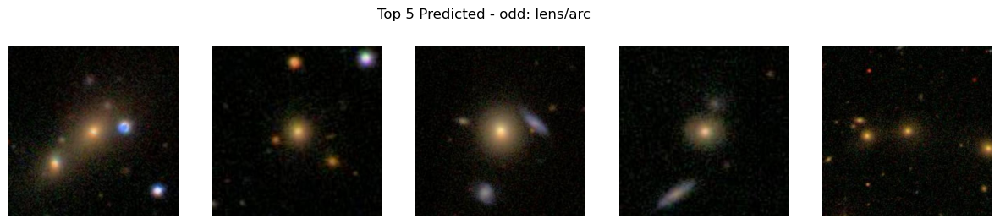

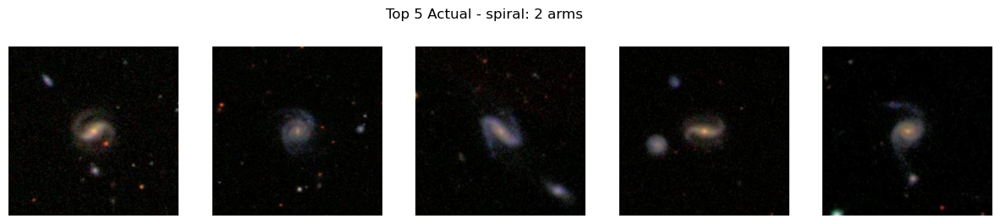

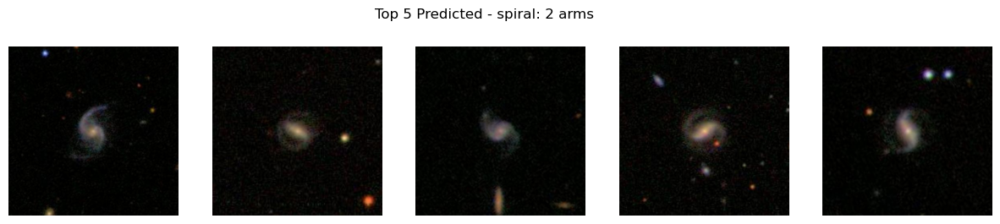

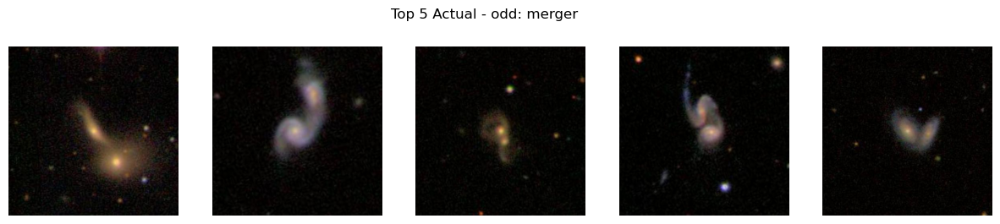

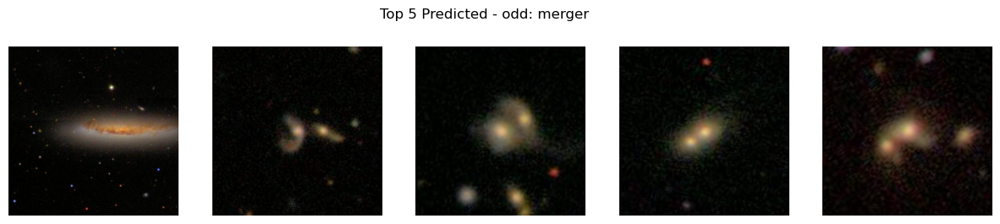

In [95]:
valid_df['ImagePath'] = valid_df['GalaxyID'].apply(lambda x: f"training_images/{x}.jpg")

# labels of interest
labels_of_interest = {
    'Class1.1': 'smooth',
    'Class1.3': 'star/artifact',
    'Class2.1': 'edge-on disk',
    'Class8.1': 'odd: ring',
    'Class8.2': 'odd: lens/arc',
    'Class11.2': 'spiral: 2 arms',
    'Class8.6': 'odd: merger'
}

def plot_top_images(df, label_column, title):
    fig, axs = plt.subplots(1, 5, figsize=(15, 3))
    top_images = df.nlargest(5, label_column)['ImagePath']
    for ax, img_path in zip(axs, top_images):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')
    plt.suptitle(title)
    plt.show()

# Plotting top images based on actual and predicted labels
for label, desc in labels_of_interest.items():
    plot_top_images(valid_df, label, f'Top 5 Actual - {desc}')
    plot_top_images(valid_df, 'predicted_' + label, f'Top 5 Predicted - {desc}')